In [27]:
import json
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from skimage import draw, transform

In [28]:
def polygon2mask(polygon, image_size=224):
    """
    Create an image mask from polygon coordinates
    """
    vertex_row_coords, vertex_col_coords, shape = polygon[:, 1], polygon[:, 0], (450, 600)
    
    fill_row_coords, fill_col_coords = draw.polygon(vertex_row_coords, vertex_col_coords, shape)
    mask = np.zeros(shape, dtype=float)
    mask[fill_row_coords, fill_col_coords] = 1.
    mask = transform.resize(mask, (image_size, image_size))
    return mask

In [29]:
def load_annotation_json(file_path, base_path):
    full_path = os.path.join(base_path, file_path)
    if not os.path.exists(full_path):
        print(f"Annotation file not found: {full_path}")
        return None
    try:
        with open(full_path, 'r') as f:
            content_str = f.read()
            try:
                data = json.loads(content_str)
                if isinstance(data, str): # If it's still a string, parse it again
                    data = json.loads(data)
                return data
            except json.JSONDecodeError as e:
                print(f"JSON decode error for {full_path}: {e}. Attempting ast.literal_eval as fallback.")
                try:
                    # Ensure the string is properly quoted for ast.literal_eval if it's a raw dict string
                    # This part is tricky because the example shows a string that IS a valid JSON string
                    # The double parsing in the try block should handle the example format.
                    # If ast.literal_eval is needed, the string might be like '{...}' not \"{...}\"
                    data = ast.literal_eval(content_str) 
                    return data
                except (ValueError, SyntaxError) as e_ast:
                    print(f"ast.literal_eval also failed for {full_path}: {e_ast}")
                    return None
    except Exception as e:
        print(f"Error reading or parsing file {full_path}: {e}")
        return None

In [30]:
# Path to the main annotation summary JSON file
# Notebook is in ham-concept/pre-processing/
ANNOTATION_SUMMARY_PATH = "../ham_concept_dataset/participant_only.json"
# Base path for resolving image_dir and annotation file paths
DATASET_BASE_PATH = "../ham_concept_dataset/"

summary_data = []
if os.path.exists(ANNOTATION_SUMMARY_PATH):
    with open(ANNOTATION_SUMMARY_PATH, 'r') as f:
        try:
            summary_data = json.load(f)
            print(f"Successfully loaded {len(summary_data)} entries from {ANNOTATION_SUMMARY_PATH}")
        except json.JSONDecodeError as e:
            print(f"Error decoding JSON from {ANNOTATION_SUMMARY_PATH}: {e}")
else:
    print(f"Error: Annotation summary file not found at {ANNOTATION_SUMMARY_PATH}")

# List of all known concepts (from your prompt)
ALL_CONCEPTS = [
    "TRBL", "ESA", "GP", "PV", "BDG", "WLSA", "PLR", "PES", "PIF", 
    "OPC", "SPC", "MVP", "PRL", "PLF", "PDES", "APC", "MS", "PRLC"
]

Successfully loaded 196 entries from ../ham_concept_dataset/participant_only.json



--- Processing ISIC ID: ISIC_0024319 ---


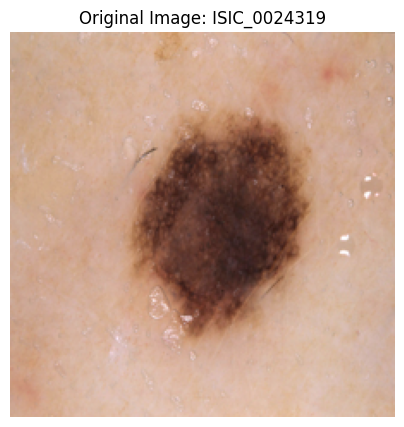

  Processing Annotator annotations...
    Annotations from: Datasets/ground_truth_annotations/annotator1/ISIC_0024319.json


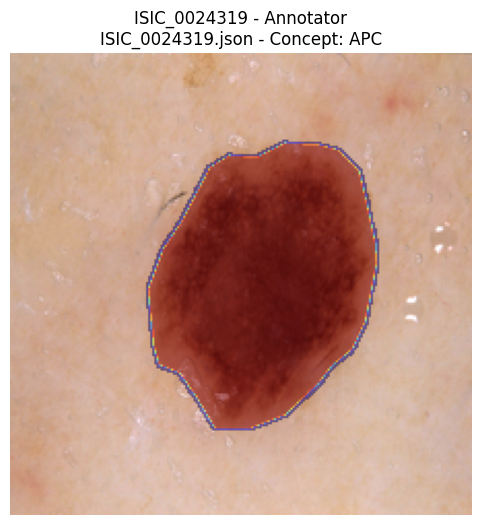

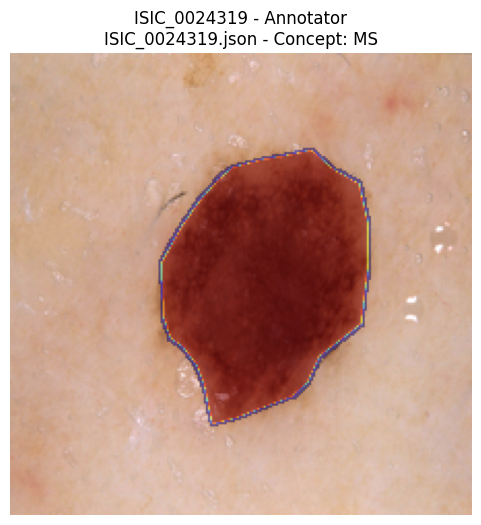

    Annotations from: Datasets/ground_truth_annotations/annotator7/ISIC_0024319.json


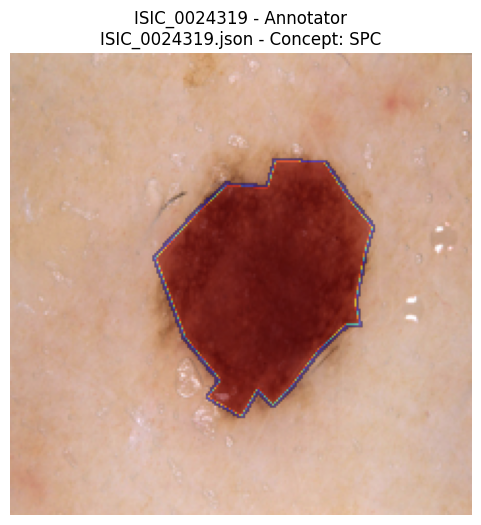

  Processing Participant annotations...
    Annotations from: Datasets/study_annotations/participant12/ISIC_0024319.json


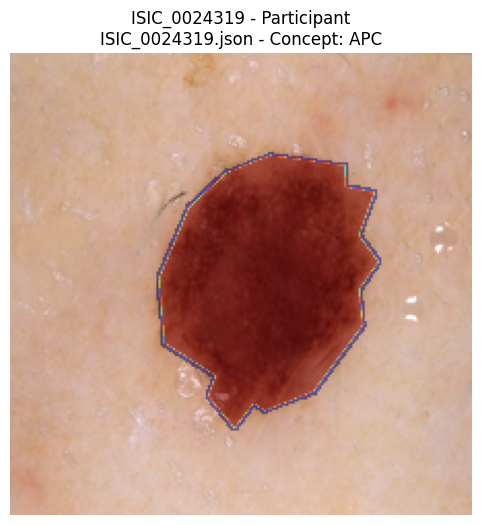

    Annotations from: Datasets/study_annotations/participant46/ISIC_0024319.json


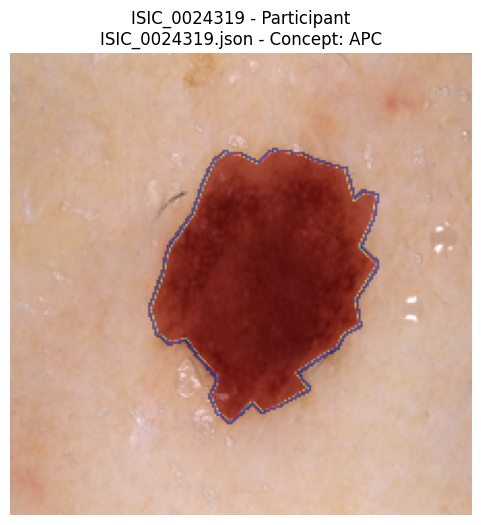

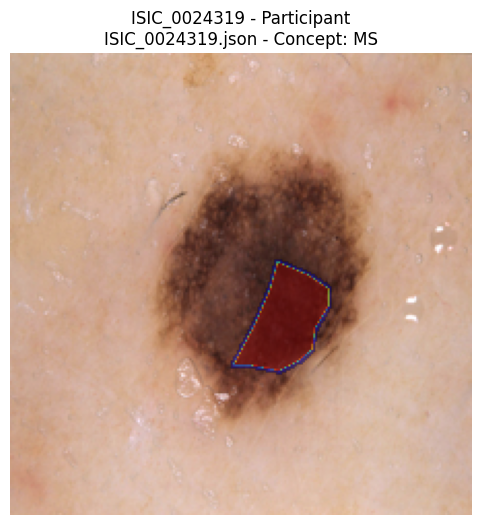

    Annotations from: Datasets/study_annotations/participant62/ISIC_0024319.json


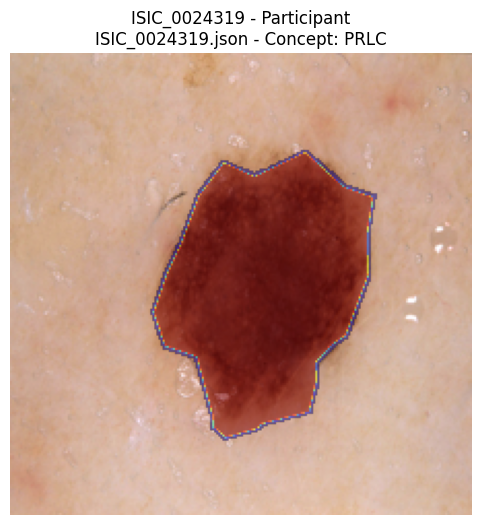

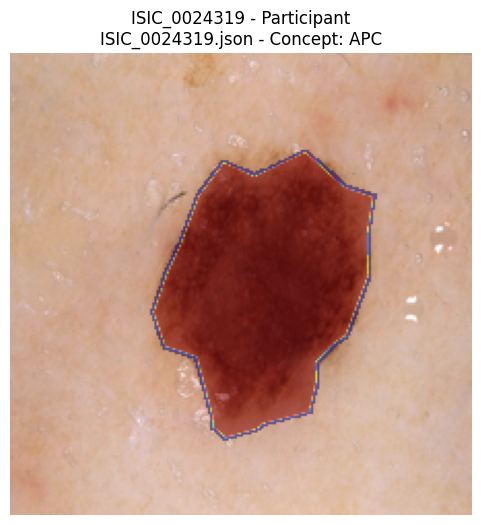

    Annotations from: Datasets/study_annotations/participant65/ISIC_0024319.json


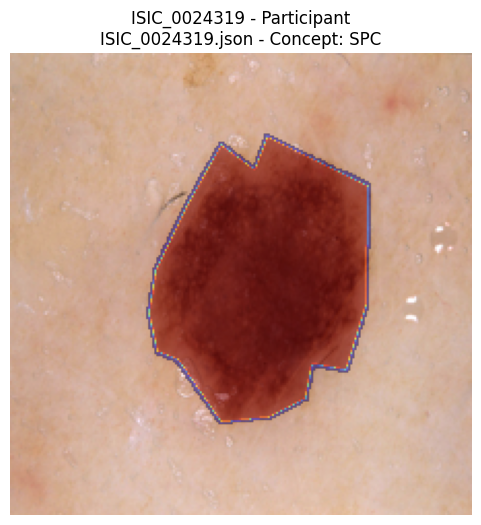

    Annotations from: Datasets/study_annotations/participant7/ISIC_0024319.json


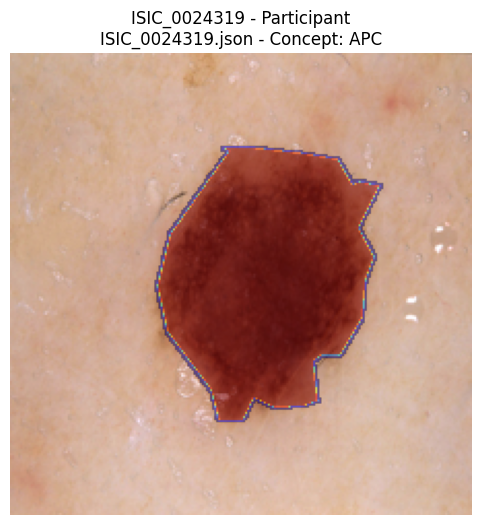

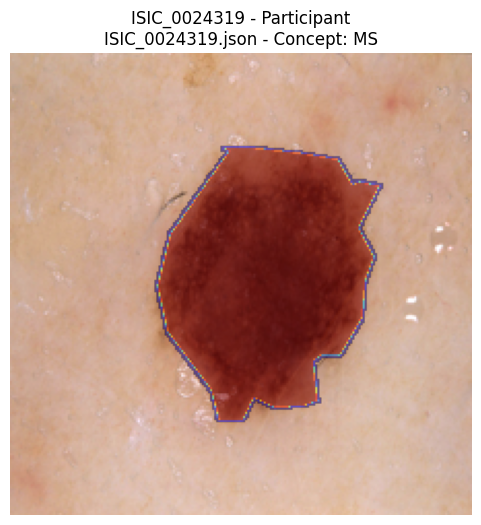

    Annotations from: Datasets/study_annotations/participant74/ISIC_0024319.json


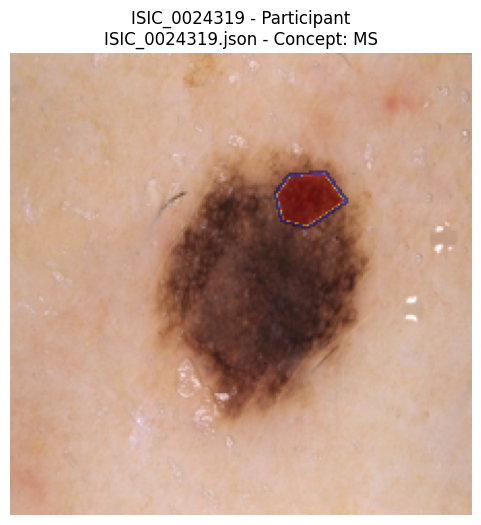

    Annotations from: Datasets/study_annotations/participant86/ISIC_0024319.json


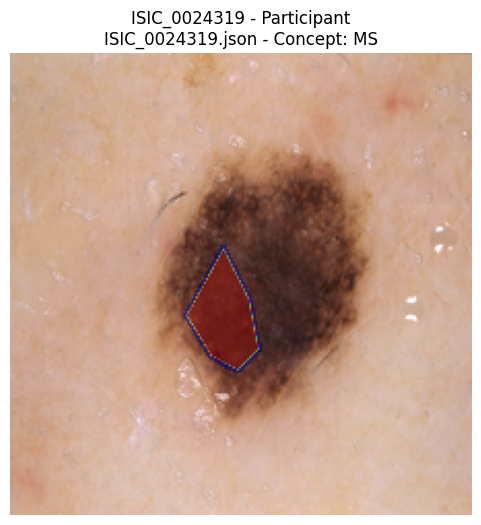


--- Processing ISIC ID: ISIC_0024428 ---


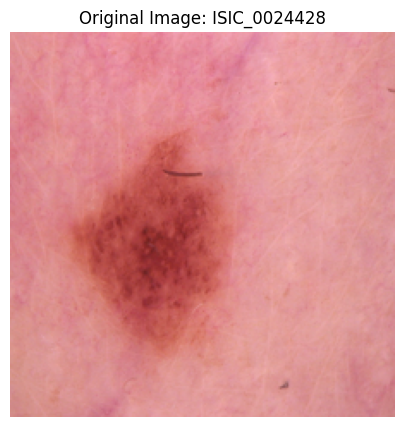

  Processing Annotator annotations...
    Annotations from: Datasets/ground_truth_annotations/annotator1/ISIC_0024428.json


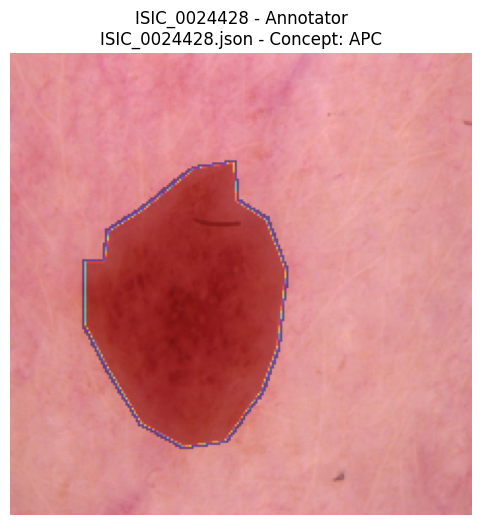

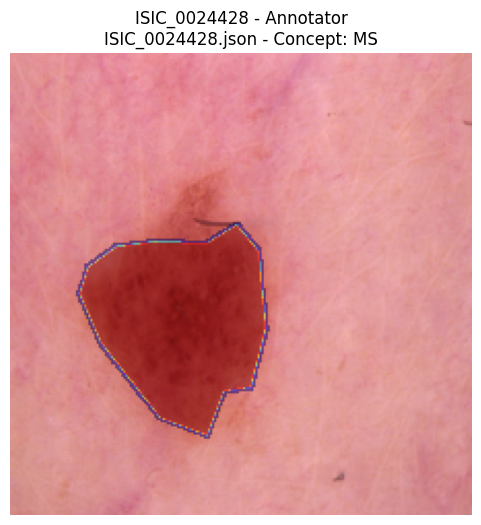

    Annotations from: Datasets/ground_truth_annotations/annotator10/ISIC_0024428.json


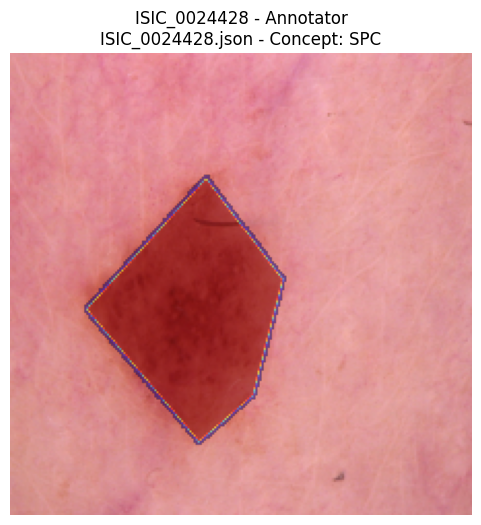

  Processing Participant annotations...
    Annotations from: Datasets/study_annotations/participant12/ISIC_0024428.json


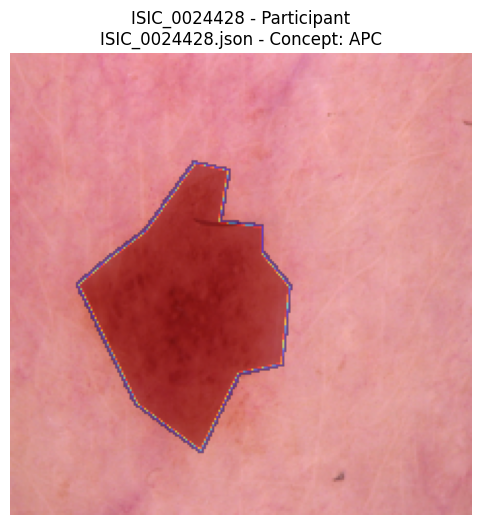

    Annotations from: Datasets/study_annotations/participant46/ISIC_0024428.json


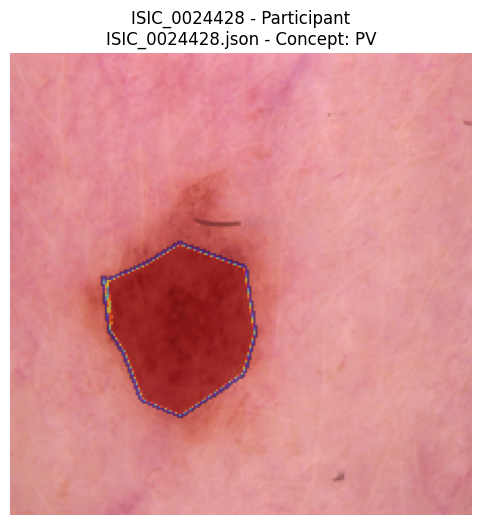

    Annotations from: Datasets/study_annotations/participant62/ISIC_0024428.json


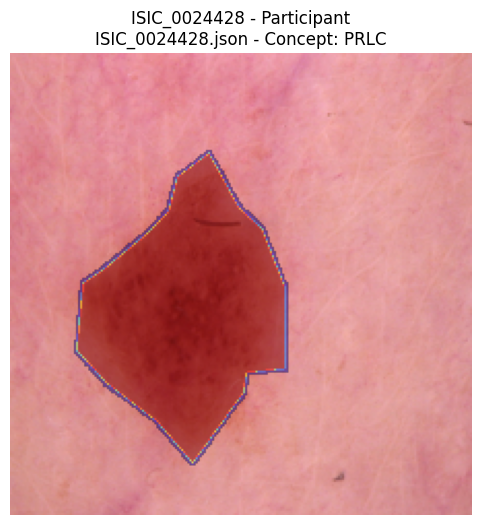

    Could not load or parse annotation data from Datasets/study_annotations/participant65/ISIC_0024428.json
    Annotations from: Datasets/study_annotations/participant7/ISIC_0024428.json


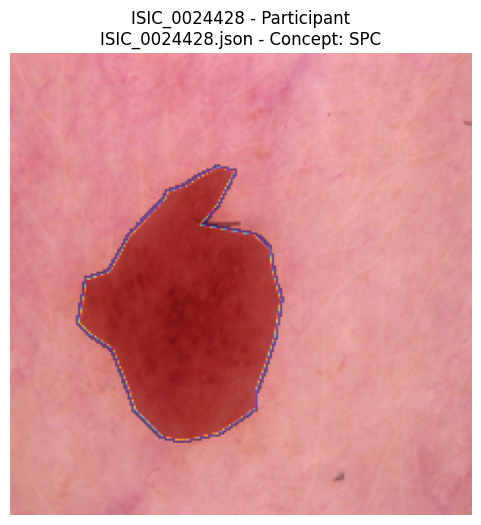

    Annotations from: Datasets/study_annotations/participant74/ISIC_0024428.json


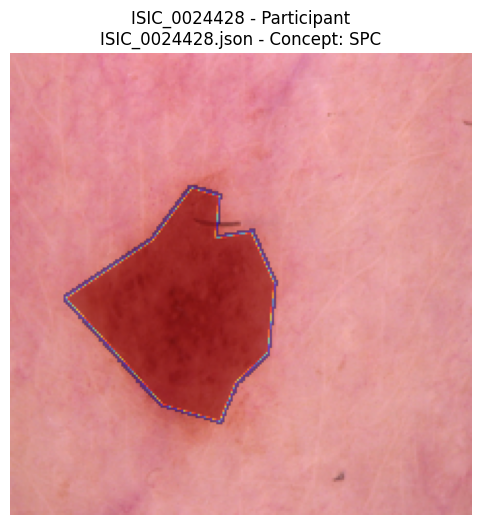

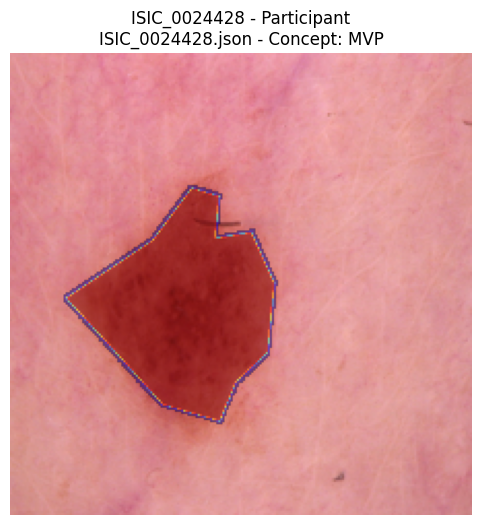

    Annotations from: Datasets/study_annotations/participant86/ISIC_0024428.json


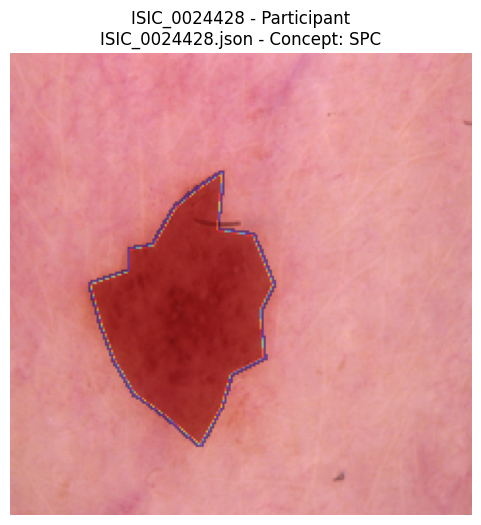


--- Processing ISIC ID: ISIC_0024458 ---


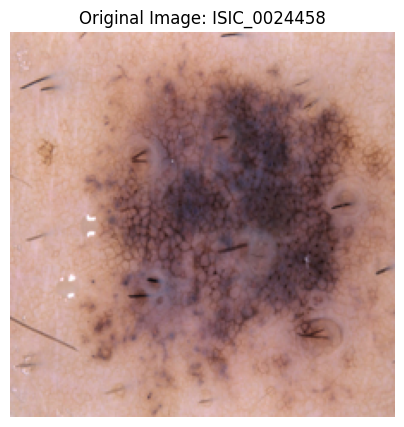

  Processing Annotator annotations...
    Annotations from: Datasets/ground_truth_annotations/annotator1/ISIC_0024458.json


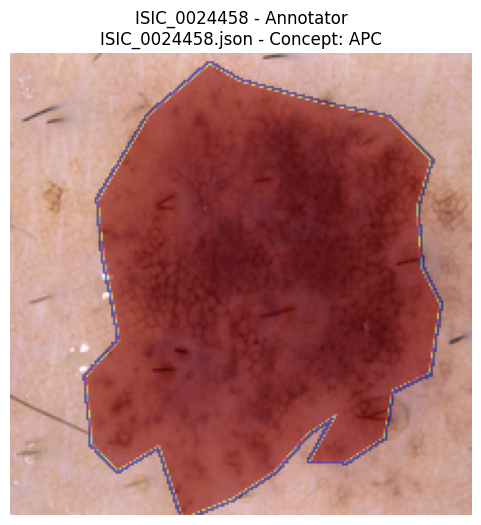

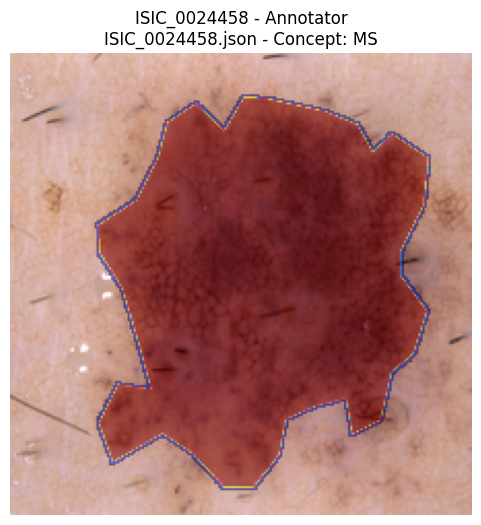

    Annotations from: Datasets/ground_truth_annotations/annotator3/ISIC_0024458.json


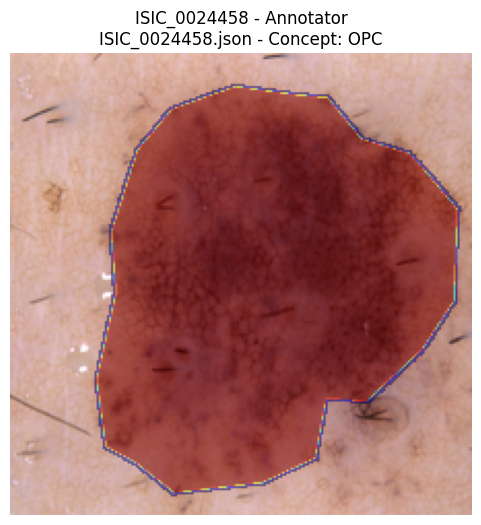

  Processing Participant annotations...
    Annotations from: Datasets/study_annotations/participant100/ISIC_0024458.json


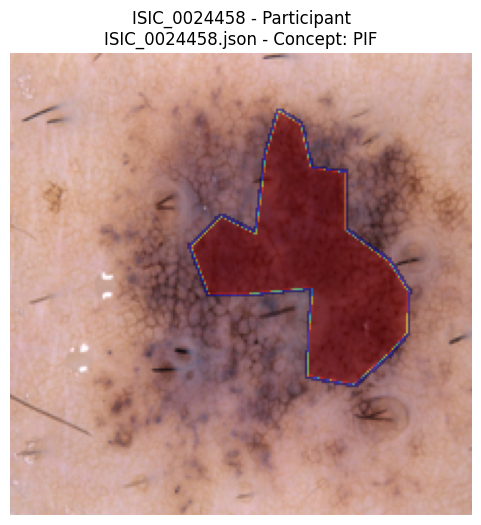

    Annotations from: Datasets/study_annotations/participant108/ISIC_0024458.json


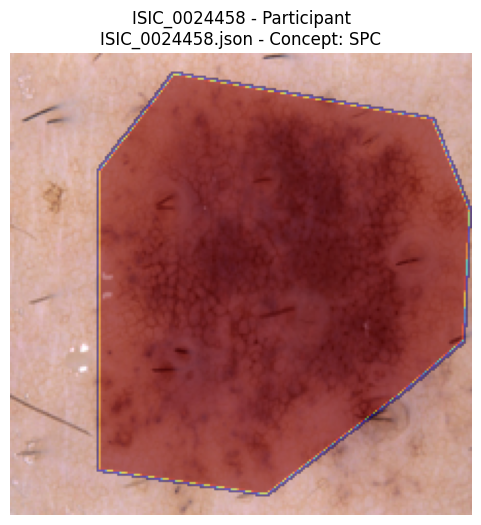

    Annotations from: Datasets/study_annotations/participant20/ISIC_0024458.json


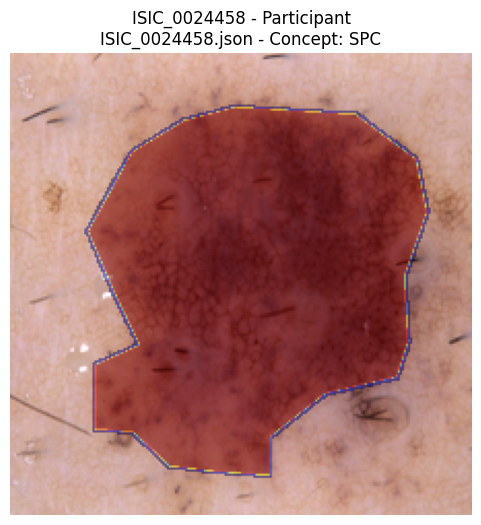

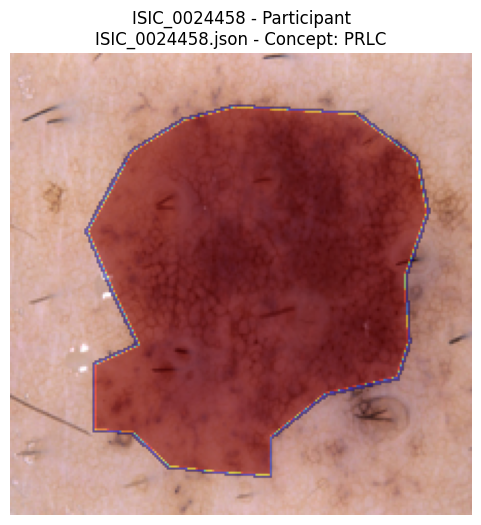

    Annotations from: Datasets/study_annotations/participant29/ISIC_0024458.json


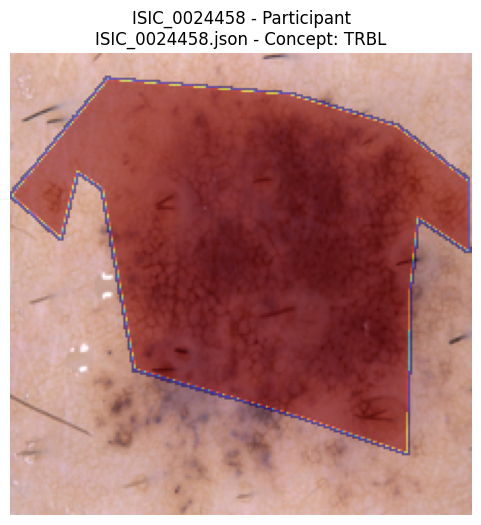

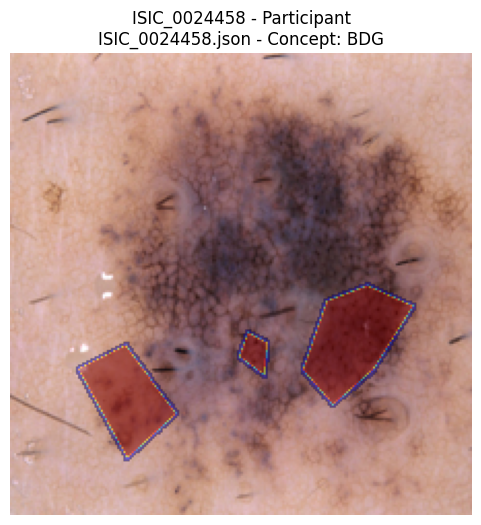

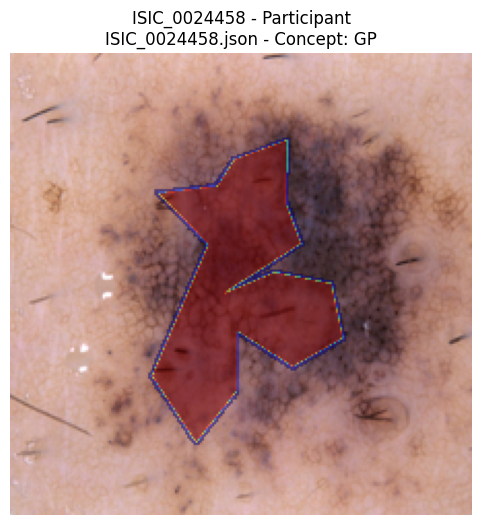

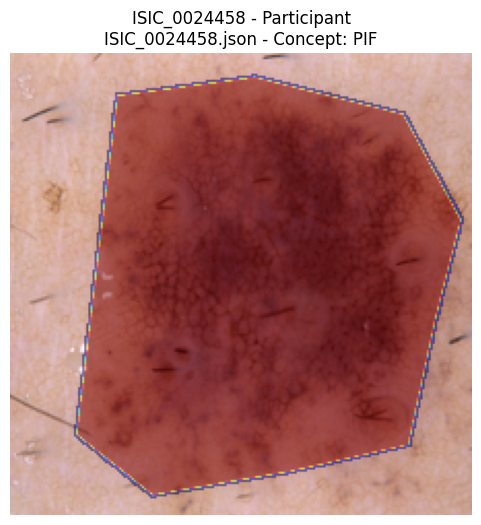

    Annotations from: Datasets/study_annotations/participant34/ISIC_0024458.json


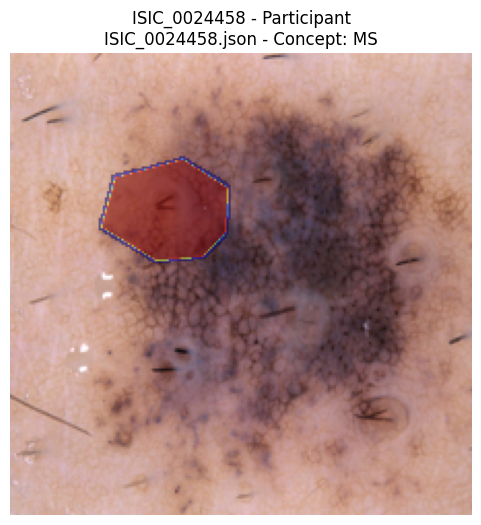

    Annotations from: Datasets/study_annotations/participant55/ISIC_0024458.json


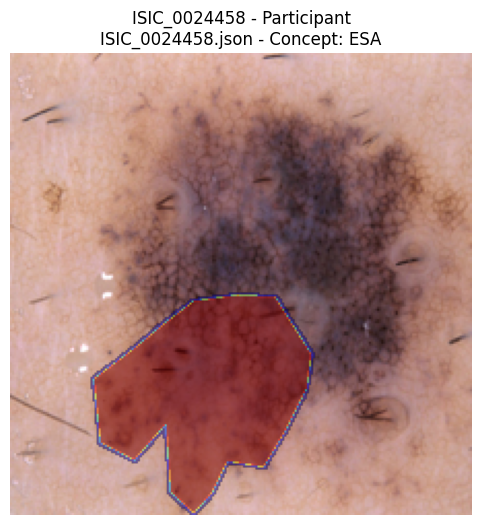

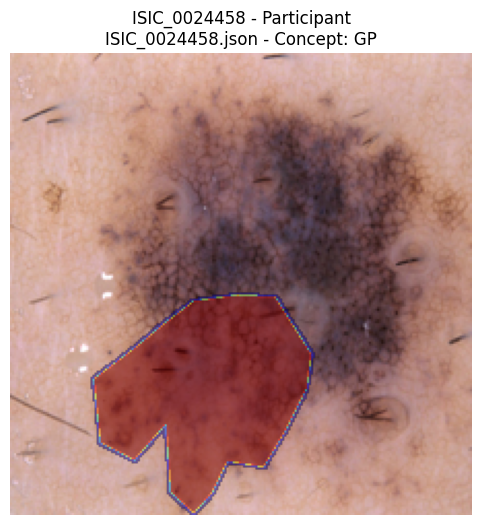

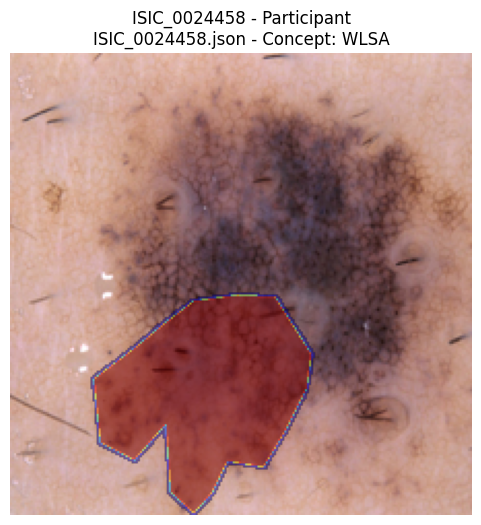

    Annotations from: Datasets/study_annotations/participant57/ISIC_0024458.json


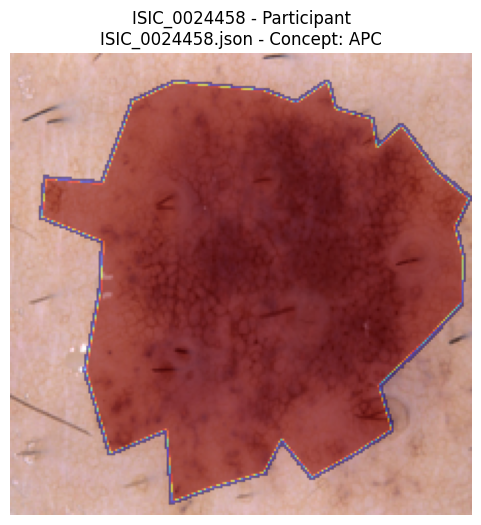

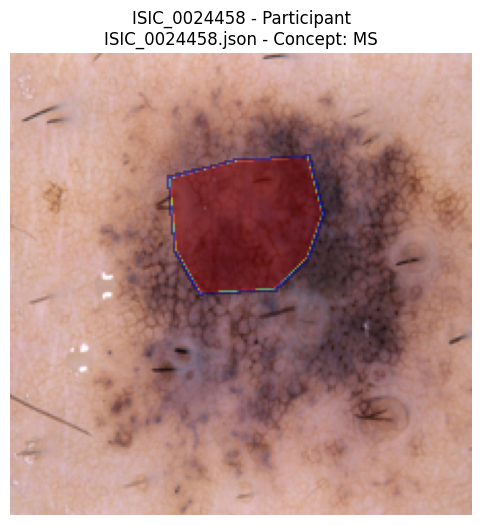

    Annotations from: Datasets/study_annotations/participant61/ISIC_0024458.json


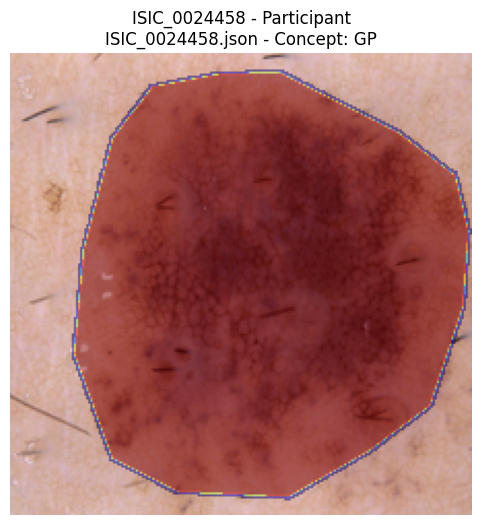

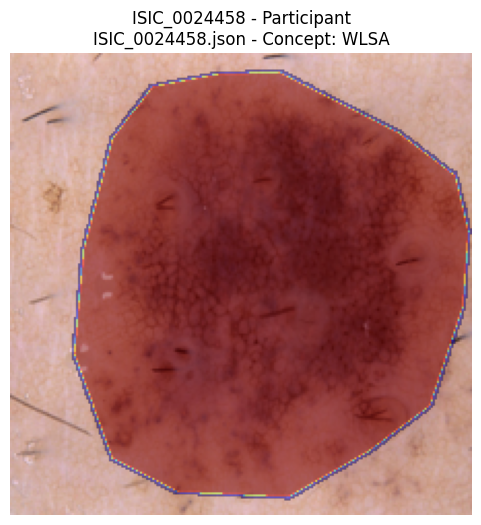

    Annotations from: Datasets/study_annotations/participant68/ISIC_0024458.json


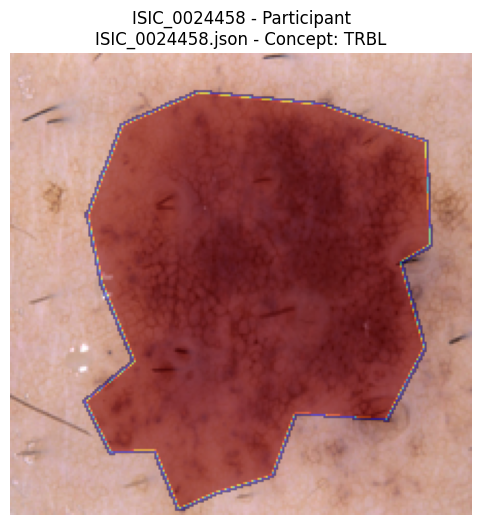

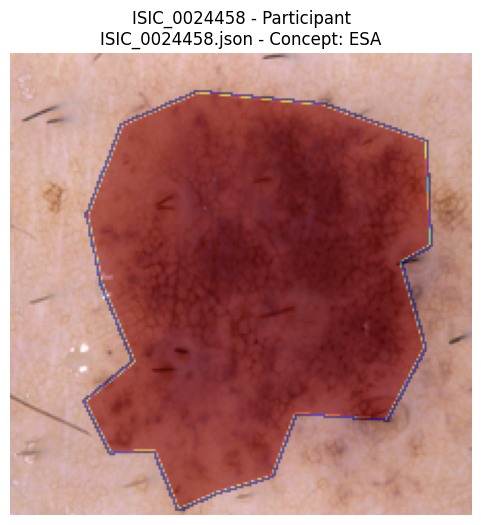

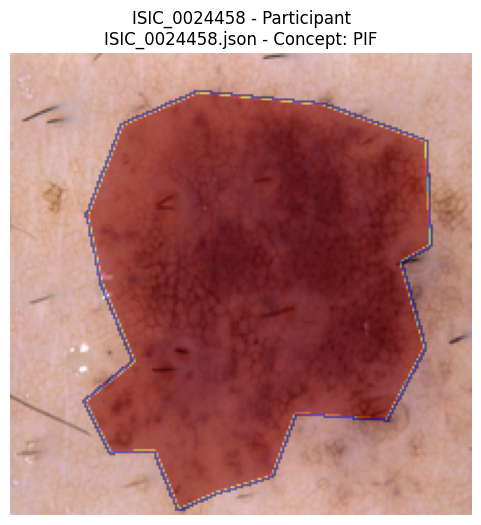

    Annotations from: Datasets/study_annotations/participant75/ISIC_0024458.json


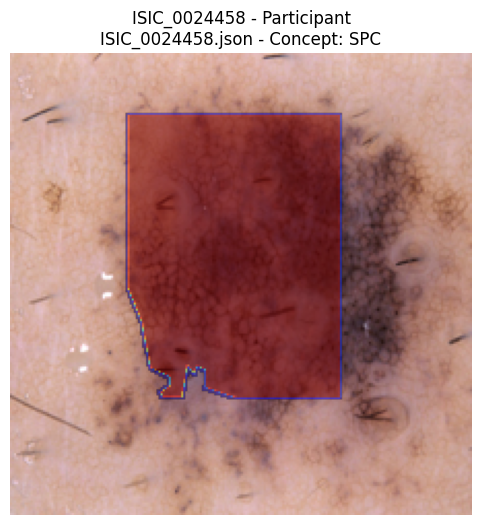

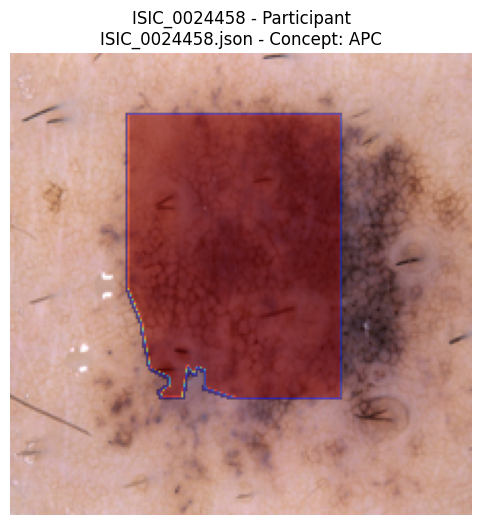

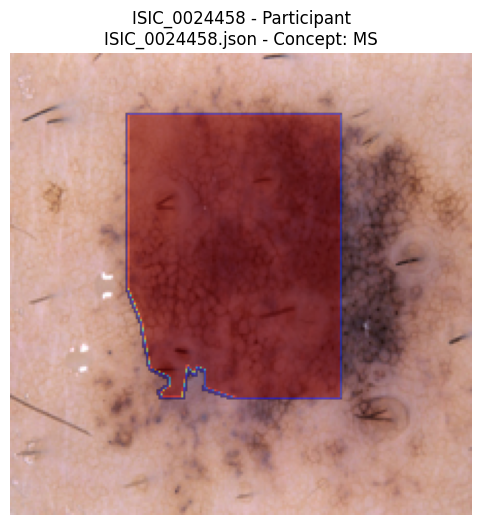

In [31]:
NUM_EXAMPLES_TO_SHOW = 3 # Adjust as needed
IMAGE_DISPLAY_SIZE = 224 # For displaying image and masks

if summary_data:
    for i, item_summary in enumerate(summary_data[:NUM_EXAMPLES_TO_SHOW]):
        isic_id = item_summary.get("isic_id")
        image_relative_path = item_summary.get("image_dir")
        annotator_files = item_summary.get("annotator_list", [])
        participant_files = item_summary.get("participant_list", [])

        if not image_relative_path:
            print(f"Skipping ISIC ID {isic_id}: missing image_dir.")
            continue

        image_full_path = os.path.join(DATASET_BASE_PATH, image_relative_path)
        if not os.path.exists(image_full_path):
            print(f"Skipping ISIC ID {isic_id}: image file not found at {image_full_path}.")
            continue

        print(f"\n--- Processing ISIC ID: {isic_id} ---")
        try:
            original_image = Image.open(image_full_path).convert("RGB")
            original_image_for_display = original_image.resize((IMAGE_DISPLAY_SIZE, IMAGE_DISPLAY_SIZE))
            # original_height and original_width are no longer directly used by the new polygon2mask
            # but good to keep if you want to verify the hardcoded (450,600) assumption later.
            original_image_np = np.array(original_image) 
            original_height, original_width = original_image_np.shape[0], original_image_np.shape[1]
            if original_height != 450 or original_width != 600:
                print(f"    WARNING: Original image {isic_id} dimensions ({original_height}x{original_width}) "
                      f"do not match hardcoded shape (450x600) in polygon2mask. Masks may be incorrect.")

        except Exception as e:
            print(f"Error loading image {image_full_path}: {e}")
            continue

        # Display original image
        plt.figure(figsize=(5, 5))
        plt.imshow(original_image_for_display)
        plt.title(f"Original Image: {isic_id}")
        plt.axis('off')
        plt.show()

        all_annotation_sources = [("Annotator", annotator_files), ("Participant", participant_files)]

        for source_type, file_list in all_annotation_sources:
            if not file_list:
                continue
            print(f"  Processing {source_type} annotations...")
            for ann_file_rel_path in file_list:
                annotation_data = load_annotation_json(ann_file_rel_path, DATASET_BASE_PATH)
                if not annotation_data or not isinstance(annotation_data, dict):
                    print(f"    Could not load or parse annotation data from {ann_file_rel_path}")
                    continue
                
                print(f"    Annotations from: {ann_file_rel_path}")
                
                for concept_abbr, polygons_list_of_lists in annotation_data.items():
                    if concept_abbr not in ALL_CONCEPTS:
                        continue 
                    
                    if not isinstance(polygons_list_of_lists, list) or not polygons_list_of_lists:
                        continue

                    combined_mask_for_concept = np.zeros((IMAGE_DISPLAY_SIZE, IMAGE_DISPLAY_SIZE), dtype=float)
                    
                    for single_polygon_coords in polygons_list_of_lists:
                        if not isinstance(single_polygon_coords, list) or len(single_polygon_coords) < 3:
                            continue
                        try:
                            # Convert list of coordinates to NumPy array for the new polygon2mask
                            polygon_np = np.array(single_polygon_coords)
                            
                            # Call the updated polygon2mask function
                            # It now uses IMAGE_DISPLAY_SIZE for its 'image_size' argument
                            # and internally hardcodes the original drawing dimensions.
                            mask = polygon2mask(polygon_np, 
                                                image_size=IMAGE_DISPLAY_SIZE)
                            combined_mask_for_concept = np.maximum(combined_mask_for_concept, mask)
                        except Exception as e:
                            print(f"      Error generating mask for {concept_abbr} with polygon {single_polygon_coords}: {e}")
                    
                    if np.sum(combined_mask_for_concept) > 0:
                        plt.figure(figsize=(6, 6))
                        plt.imshow(original_image_for_display)
                        
                        # Create a masked version of the concept mask
                        # This makes the 0-values in the mask transparent
                        masked_concept_overlay = np.ma.masked_where(combined_mask_for_concept == 0, combined_mask_for_concept)
                        
                        plt.imshow(masked_concept_overlay, cmap='jet', alpha=0.5) 
                        plt.title(f"{isic_id} - {source_type}\n{os.path.basename(ann_file_rel_path)} - Concept: {concept_abbr}")
                        plt.axis('off')
                        plt.show()
        if i >= NUM_EXAMPLES_TO_SHOW -1:
            break 
else:
    print("No summary data loaded. Cannot visualize.")

A few things noteworthy:
- Some concepts are just a segmentation of the lesion
- Some manual segmentation are not accurate, some seem lazy
- Some concept segmentation have the same polygon